# **imports**

In [ ]:
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from os import listdir
import tensorflow as tf


# **Loading data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
x_train=[]
i=0
for images in os.listdir('/content/drive/MyDrive/catsss'):
    img = cv2.imread(("/content/drive/MyDrive/catsss//" +images),cv2.IMREAD_UNCHANGED)

    if(type(img) == type(None) or len(img.shape) !=3 or img.shape[2]!=3):
      pass
    else:
      resized = cv2.resize(img, (256,256), interpolation = cv2.INTER_AREA)
      normalize=(np.asarray(resized).astype('float32')) / 255
      x_train.append(normalize)

In [ ]:
x_train = np.array(x_train)

In [ ]:
x_test=[]
i=0
for images in os.listdir('test'):
    img = cv2.cvtColor(cv2.imread(("test//" +images)), cv2.COLOR_BGR2RGB)

    if(type(img) == type(None) or len(img.shape) !=3 or img.shape[2]!=3):
      pass
    else:
      resized = cv2.resize(img, (256,256), interpolation = cv2.INTER_AREA)
      normalize=(np.asarray(resized).astype('float32')) / 255
      x_test.append(normalize)

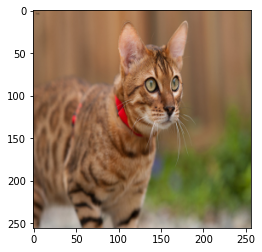

In [ ]:
plt.imshow(x_test[0])

In [ ]:
x_test = np.array(x_test)

In [ ]:
x_train.shape

(385, 256, 256, 3)

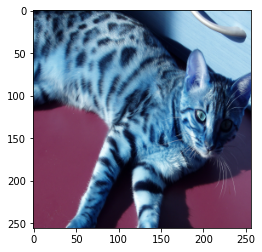

In [ ]:
plt.imshow(x_train[0])

# **Adding noise**

In [ ]:
def noisy(image):
      row,col,ch= image.shape
      mean = 0.25
      var = 0.1
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      return noisy

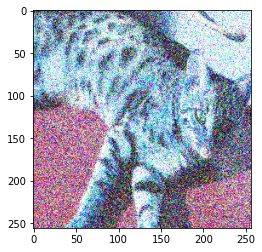

In [ ]:
x_train_noise=x_train.copy()
for img in range(x_train.shape[0]):
  x_train_noise[img]=noisy(x_train_noise[img])
plt.imshow(x_train_noise[0])

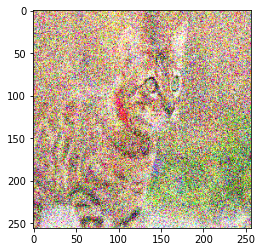

In [ ]:
x_test_noise=x_test.copy()
for img in range(x_test.shape[0]):
  x_test_noise[img]=noisy(x_test[img])
plt.imshow(x_test_noise[0])

# **Autoencoder Model (8x8)**

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
encoded = x


In [ ]:

x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

In [ ]:
autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 8)         2312  

In [ ]:
autoencoder.fit(x_train_noise, x_train,epochs=100,batch_size=16,shuffle=True,)

Epoch 1/100
25/25 [==============================] - 11s 76ms/step - loss: 0.6907
Epoch 2/100
25/25 [==============================] - 2s 60ms/step - loss: 0.6684
Epoch 3/100
25/25 [==============================] - 2s 60ms/step - loss: 0.6339
Epoch 4/100
25/25 [==============================] - 1s 60ms/step - loss: 0.6145
Epoch 5/100
25/25 [==============================] - 2s 65ms/step - loss: 0.6057
Epoch 6/100
25/25 [==============================] - 2s 60ms/step - loss: 0.6023
Epoch 7/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5988
Epoch 8/100
25/25 [==============================] - 1s 60ms/step - loss: 0.5963
Epoch 9/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5941
Epoch 10/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5920
Epoch 11/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5902
Epoch 12/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5883
Epoch 13/100
25/25 [====

In [ ]:
decoded_imgs = autoencoder.predict(x_test_noise)


1/1 [==============================] - 0s 361ms/step


#**plotting (test images with noise)**

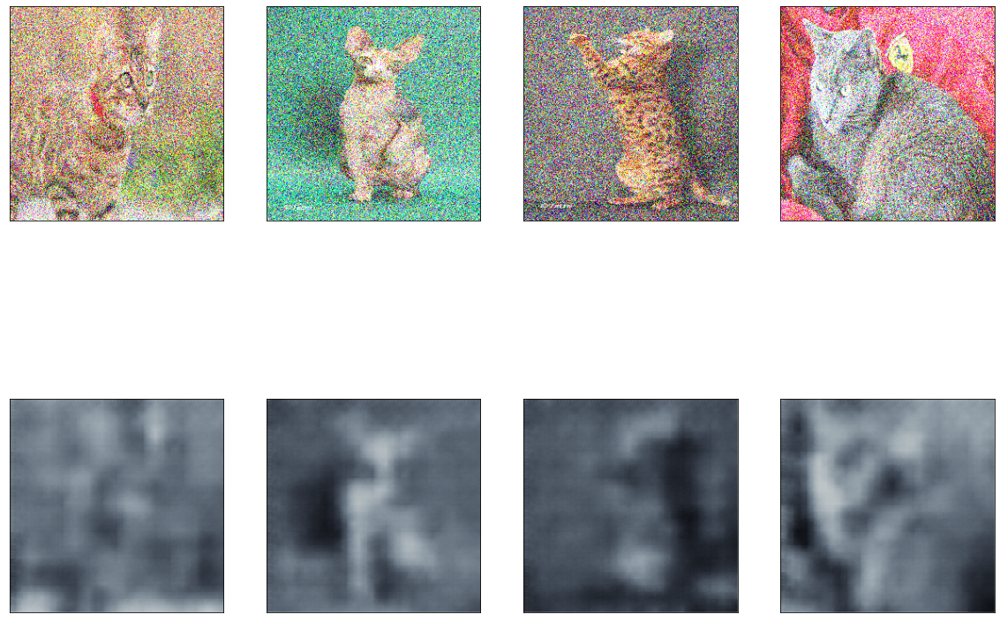

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test_noise[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Encoder**

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)
encoded_imgs_noise=encoded_imgs.copy()
for img in range(encoded_imgs.shape[0]):
  encoded_imgs_noise[img]=noisy(encoded_imgs[img])
encoded_imgs[0].shape

1/1 [==============================] - 0s 84ms/step


(8, 8, 8)


**Encoded vector without noise**

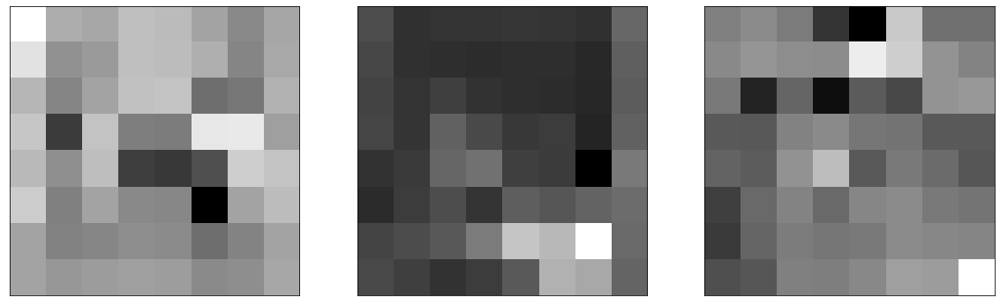

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((8, 8)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()


**Encoded vector with noise**

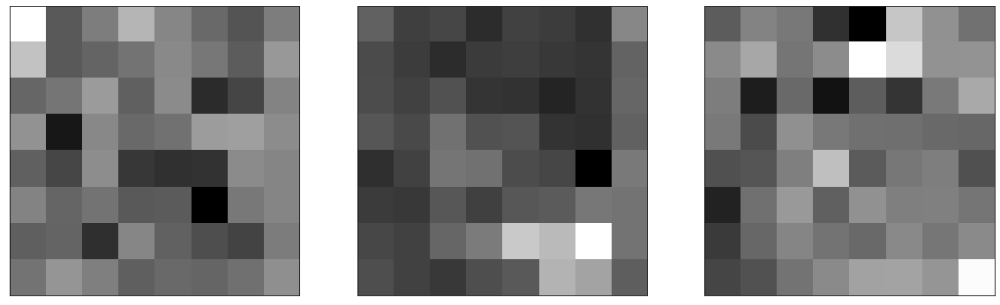

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs_noise[i,:,:,0].reshape((8, 8)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Decoder**

In [ ]:
encoded_input = keras.Input(shape=(8, 8, 8))

In [ ]:
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)


decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 8, 8, 8)]         0         
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 16, 16, 8)        584       
 ranspose)                                                       
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 32, 32, 8)        584       
 ranspose)                                                       
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 64, 64, 8)        584       
 ranspose)                                                       
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 128, 128, 8)      584       
 ranspose)                                                 

In [ ]:
len(autoencoder.weights)

22

In [ ]:
k = 0
for i in range (10,22):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

In [ ]:
decoded_imgs = decoder.predict(encoded_imgs_noise)

1/1 [==============================] - 0s 99ms/step


#**plotting test images without noise with the noised encoded vector**

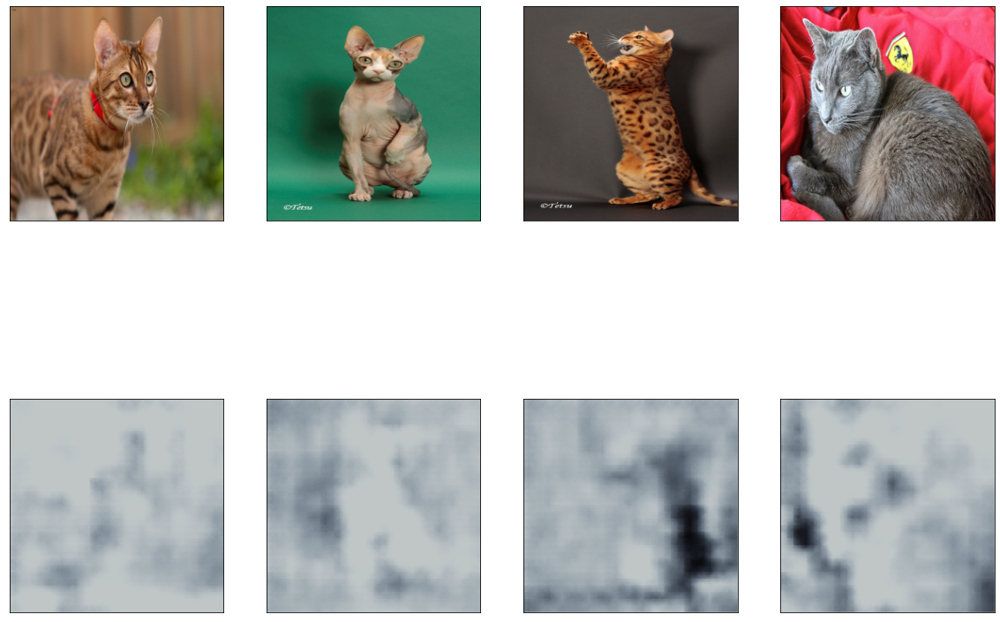

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# **Autoencoder Model (16x16)**

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)

encoded = x

In [ ]:

x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

In [ ]:
autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_7 (Conv2D)           (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 128, 128, 64)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 128, 128, 32)      18464     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 64, 64, 8)         2312

In [ ]:
autoencoder.fit(x_train_noise, x_train,epochs=100,batch_size=16,shuffle=True,)

Epoch 1/100
25/25 [==============================] - 2s 66ms/step - loss: 0.6903
Epoch 2/100
25/25 [==============================] - 2s 71ms/step - loss: 0.6689
Epoch 3/100
25/25 [==============================] - 2s 71ms/step - loss: 0.6233
Epoch 4/100
25/25 [==============================] - 2s 66ms/step - loss: 0.5764
Epoch 5/100
25/25 [==============================] - 2s 73ms/step - loss: 0.5601
Epoch 6/100
25/25 [==============================] - 2s 72ms/step - loss: 0.5554
Epoch 7/100
25/25 [==============================] - 2s 70ms/step - loss: 0.5528
Epoch 8/100
25/25 [==============================] - 2s 62ms/step - loss: 0.5512
Epoch 9/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5489
Epoch 10/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5520
Epoch 11/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5478
Epoch 12/100
25/25 [==============================] - 2s 62ms/step - loss: 0.5471
Epoch 13/100
25/25 [=====

In [ ]:
decoded_imgs = autoencoder.predict(x_test_noise)

1/1 [==============================] - 0s 118ms/step


#**plotting (test images with noise)**

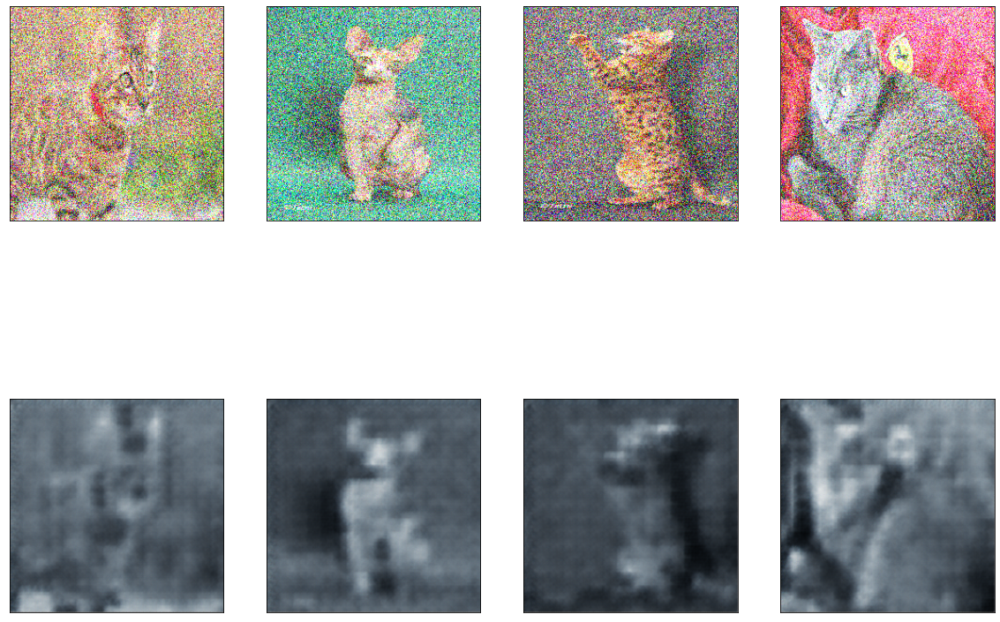

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test_noise[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Encoder**

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)
encoded_imgs_noise=encoded_imgs.copy()
for img in range(encoded_imgs.shape[0]):
  encoded_imgs_noise[img]=noisy(encoded_imgs[img])
encoded_imgs[0].shape

1/1 [==============================] - 0s 85ms/step


(16, 16, 8)

**Encoded vector without noise**

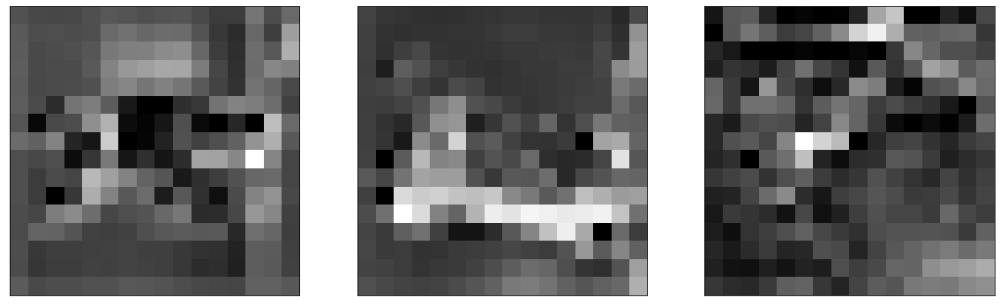

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((16, 16)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

**Encoded vector with noise**

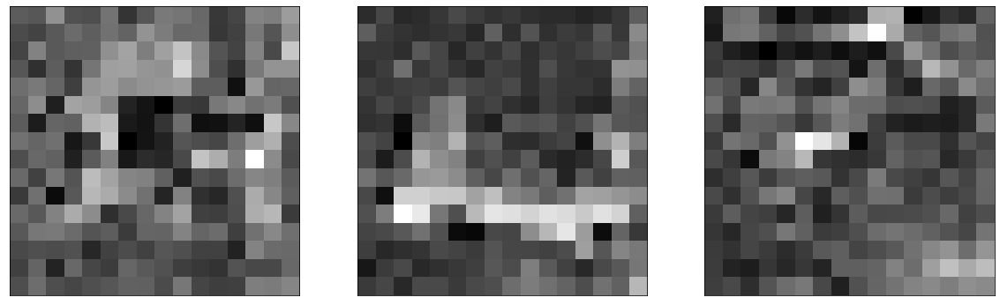

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs_noise[i,:,:,0].reshape((16, 16)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Decoder**

In [ ]:
encoded_input = keras.Input(shape=(16, 16, 8))

In [ ]:
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)


decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 16, 16, 8)]       0         
                                                                 
 conv2d_transpose_14 (Conv2D  (None, 32, 32, 8)        584       
 Transpose)                                                      
                                                                 
 conv2d_transpose_15 (Conv2D  (None, 64, 64, 8)        584       
 Transpose)                                                      
                                                                 
 conv2d_transpose_16 (Conv2D  (None, 128, 128, 8)      584       
 Transpose)                                                      
                                                                 
 conv2d_transpose_17 (Conv2D  (None, 256, 256, 8)      584       
 Transpose)                                                

In [ ]:
len(autoencoder.weights)

18

In [ ]:
k = 0
for i in range (8,18):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

In [ ]:
decoded_imgs = decoder.predict(encoded_imgs_noise)

1/1 [==============================] - 0s 94ms/step


#**plotting test images without noise with the noised encoded vector**

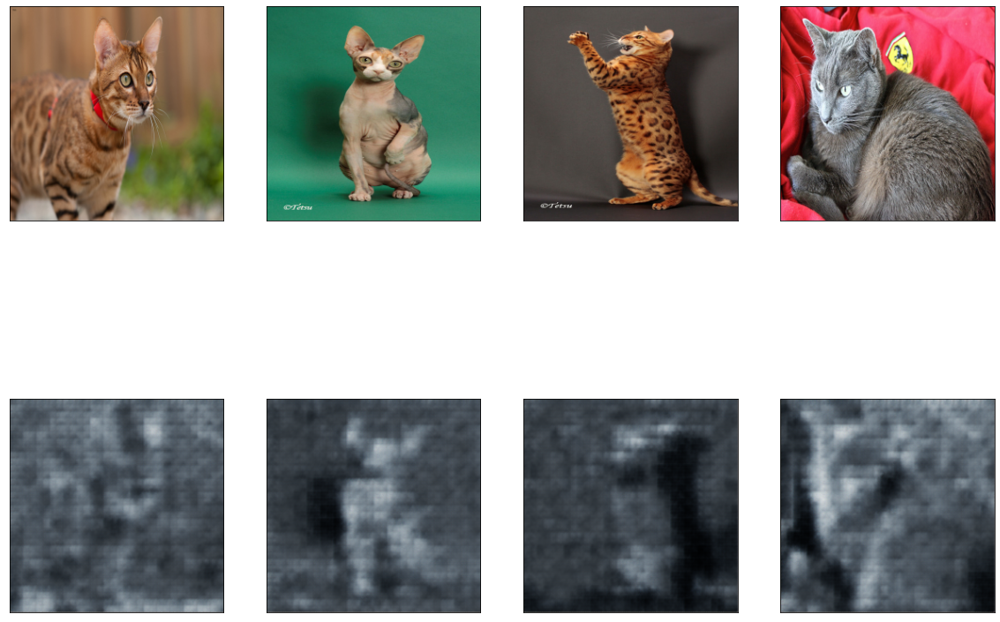

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# **Autoencoder Model (32x32)**

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)


encoded = x

In [ ]:

x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

In [ ]:
autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_13 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 128, 128, 64)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 128, 128, 32)      18464     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 64, 64, 8)         2312

In [ ]:
autoencoder.fit(x_train_noise, x_train,epochs=100,batch_size=16,shuffle=True,)

Epoch 1/100
25/25 [==============================] - 2s 63ms/step - loss: 0.6900
Epoch 2/100
25/25 [==============================] - 2s 61ms/step - loss: 0.6620
Epoch 3/100
25/25 [==============================] - 2s 60ms/step - loss: 0.6402
Epoch 4/100
25/25 [==============================] - 2s 60ms/step - loss: 0.6262
Epoch 5/100
25/25 [==============================] - 1s 60ms/step - loss: 0.5932
Epoch 6/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5529
Epoch 7/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5441
Epoch 8/100
25/25 [==============================] - 2s 61ms/step - loss: 0.5421
Epoch 9/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5405
Epoch 10/100
25/25 [==============================] - 1s 60ms/step - loss: 0.5402
Epoch 11/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5389
Epoch 12/100
25/25 [==============================] - 2s 60ms/step - loss: 0.5407
Epoch 13/100
25/25 [=====

In [ ]:
decoded_imgs = autoencoder.predict(x_test_noise)

1/1 [==============================] - 0s 110ms/step


#**plotting (test images with noise)**

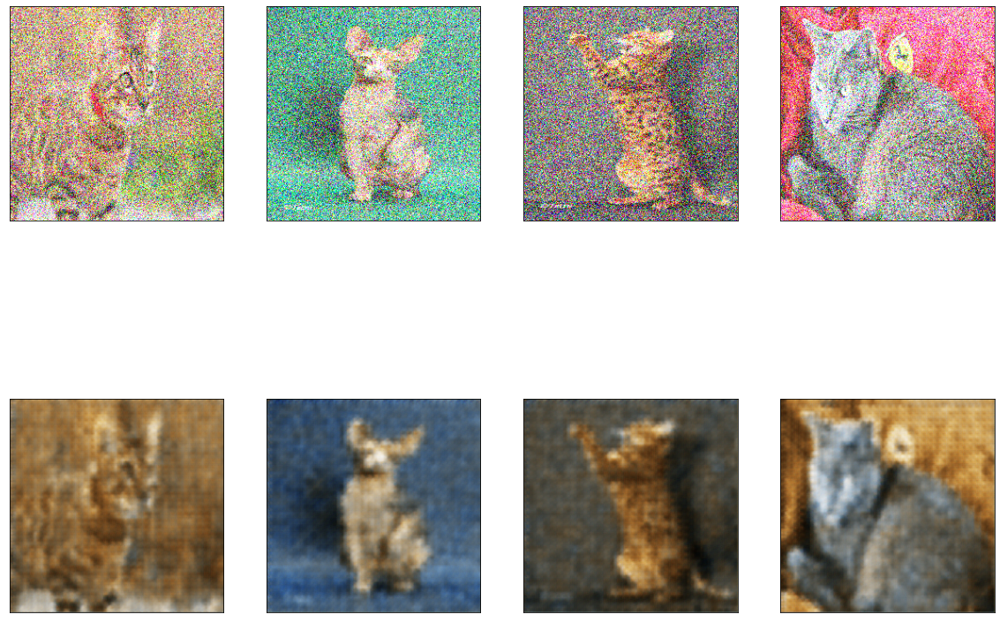

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test_noise[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Encoder**

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)
encoded_imgs_noise=encoded_imgs.copy()
for img in range(encoded_imgs.shape[0]):
  encoded_imgs_noise[img]=noisy(encoded_imgs[img])
encoded_imgs[0].shape

1/1 [==============================] - 0s 51ms/step


(32, 32, 8)

**Encoded vector without noise**

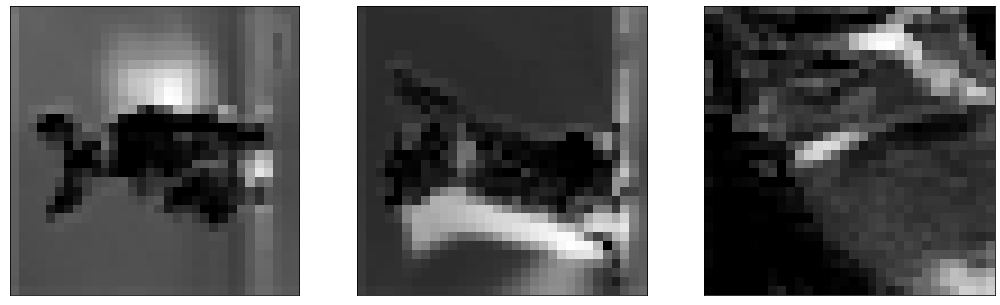

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((32, 32)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

**Encoded vector with noise**

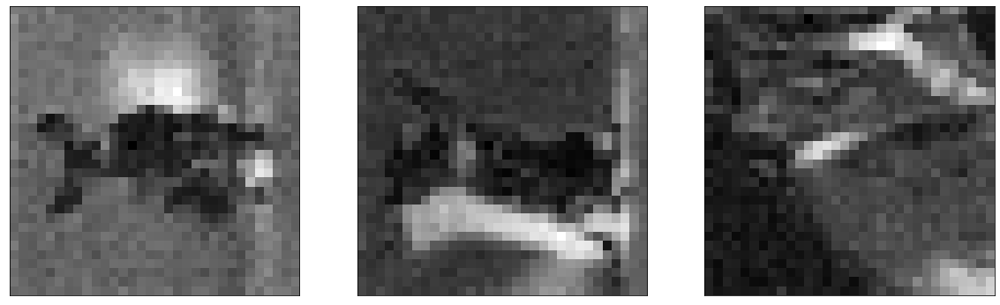

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs_noise[i,:,:,0].reshape((32, 32)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Decoder**

In [ ]:
encoded_input = keras.Input(shape=(32, 32, 8))

In [ ]:
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)


decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 32, 32, 8)]       0         
                                                                 
 conv2d_transpose_21 (Conv2D  (None, 64, 64, 8)        584       
 Transpose)                                                      
                                                                 
 conv2d_transpose_22 (Conv2D  (None, 128, 128, 8)      584       
 Transpose)                                                      
                                                                 
 conv2d_transpose_23 (Conv2D  (None, 256, 256, 8)      584       
 Transpose)                                                      
                                                                 
 conv2d_17 (Conv2D)          (None, 256, 256, 3)       219       
                                                           

In [ ]:
len(autoencoder.weights)

14

In [ ]:
k = 0
for i in range (6,14):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

In [ ]:
decoded_imgs = decoder.predict(encoded_imgs_noise)

1/1 [==============================] - 0s 75ms/step


#**plotting test images without noise with the noised encoded vector**

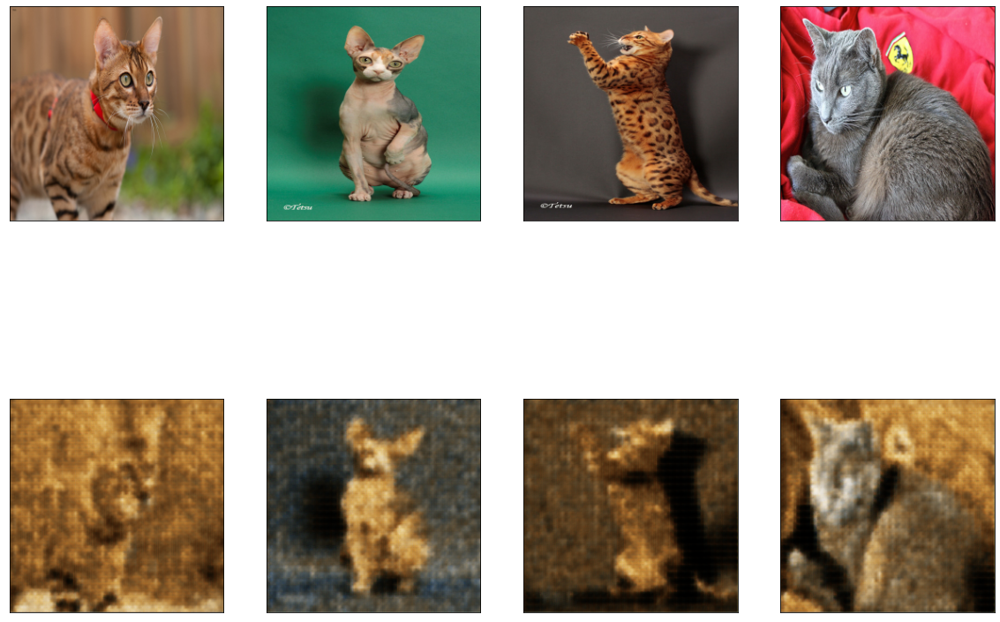

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# **Autoencoder Model (64x64)**

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)



encoded = x

In [ ]:

x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

In [ ]:
autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 128, 128, 32)      18464     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_transpose_24 (Conv2D  (None, 128, 128, 8)      2312

In [ ]:
autoencoder.fit(x_train_noise, x_train,epochs=100,batch_size=16,shuffle=True,)

Epoch 1/100
25/25 [==============================] - 2s 61ms/step - loss: 0.6707
Epoch 2/100
25/25 [==============================] - 1s 58ms/step - loss: 0.5885
Epoch 3/100
25/25 [==============================] - 1s 60ms/step - loss: 0.5559
Epoch 4/100
25/25 [==============================] - 1s 59ms/step - loss: 0.5418
Epoch 5/100
25/25 [==============================] - 1s 59ms/step - loss: 0.5369
Epoch 6/100
25/25 [==============================] - 1s 58ms/step - loss: 0.5349
Epoch 7/100
25/25 [==============================] - 1s 59ms/step - loss: 0.5307
Epoch 8/100
25/25 [==============================] - 1s 58ms/step - loss: 0.5278
Epoch 9/100
25/25 [==============================] - 1s 59ms/step - loss: 0.5261
Epoch 10/100
25/25 [==============================] - 1s 58ms/step - loss: 0.5254
Epoch 11/100
25/25 [==============================] - 1s 59ms/step - loss: 0.5248
Epoch 12/100
25/25 [==============================] - 1s 58ms/step - loss: 0.5240
Epoch 13/100
25/25 [=====

In [ ]:
decoded_imgs = autoencoder.predict(x_test_noise)

1/1 [==============================] - 0s 96ms/step


#**plotting (test images with noise)**

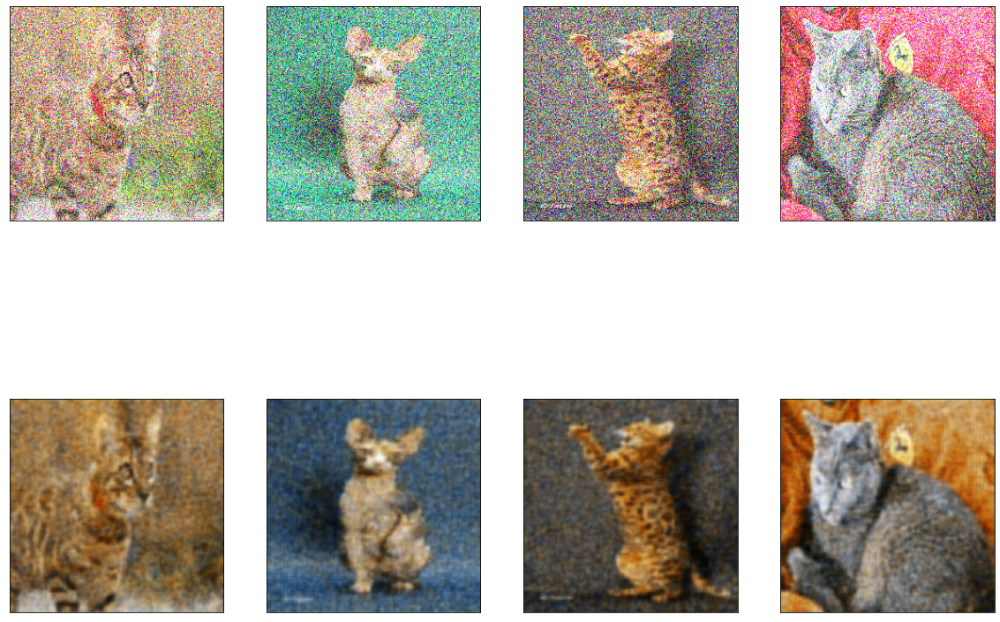

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test_noise[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Encoder**

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)
encoded_imgs_noise=encoded_imgs.copy()
for img in range(encoded_imgs.shape[0]):
  encoded_imgs_noise[img]=noisy(encoded_imgs[img])
encoded_imgs[0].shape

1/1 [==============================] - 0s 45ms/step


(64, 64, 32)

**Encoded vector without noise**

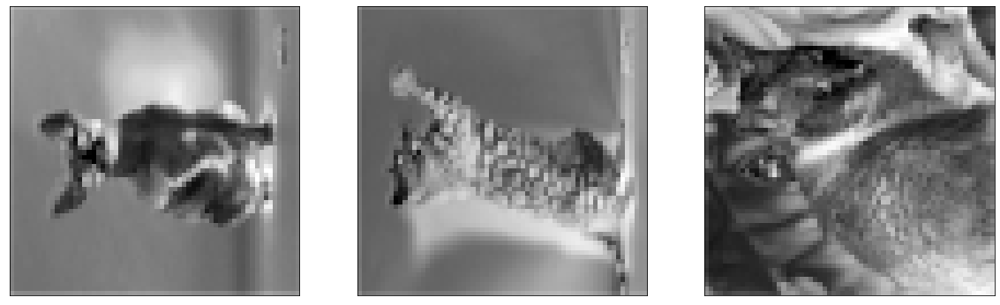

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((64, 64)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

**Encoded vector with noise**

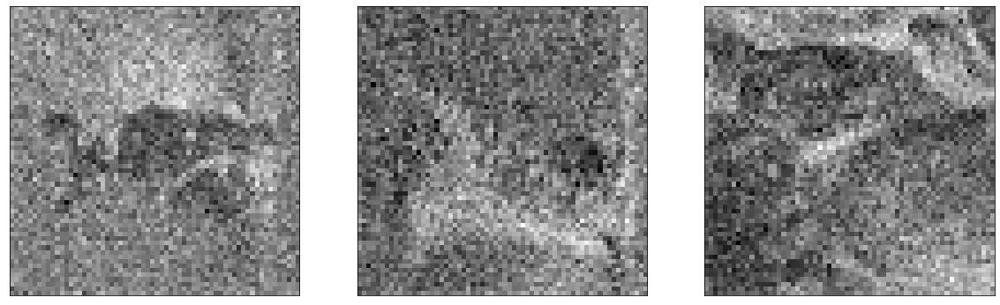

In [ ]:
n = 3
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs_noise[i,:,:,0].reshape((64, 64)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

#**Decoder**

In [ ]:
encoded_input = keras.Input(shape=(64, 64, 32))

In [ ]:
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(8, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)


decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 64, 64, 32)]      0         
                                                                 
 conv2d_transpose_30 (Conv2D  (None, 128, 128, 8)      2312      
 Transpose)                                                      
                                                                 
 conv2d_transpose_31 (Conv2D  (None, 256, 256, 8)      584       
 Transpose)                                                      
                                                                 
 conv2d_23 (Conv2D)          (None, 256, 256, 3)       219       
                                                                 
Total params: 3,115
Trainable params: 3,115
Non-trainable params: 0
_________________________________________________________________


In [ ]:
len(autoencoder.weights)

10

In [ ]:
k = 0
for i in range (4,10):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

In [ ]:
decoded_imgs = decoder.predict(encoded_imgs_noise)

1/1 [==============================] - 0s 73ms/step


#**plotting test images without noise with the noised encoded vector**

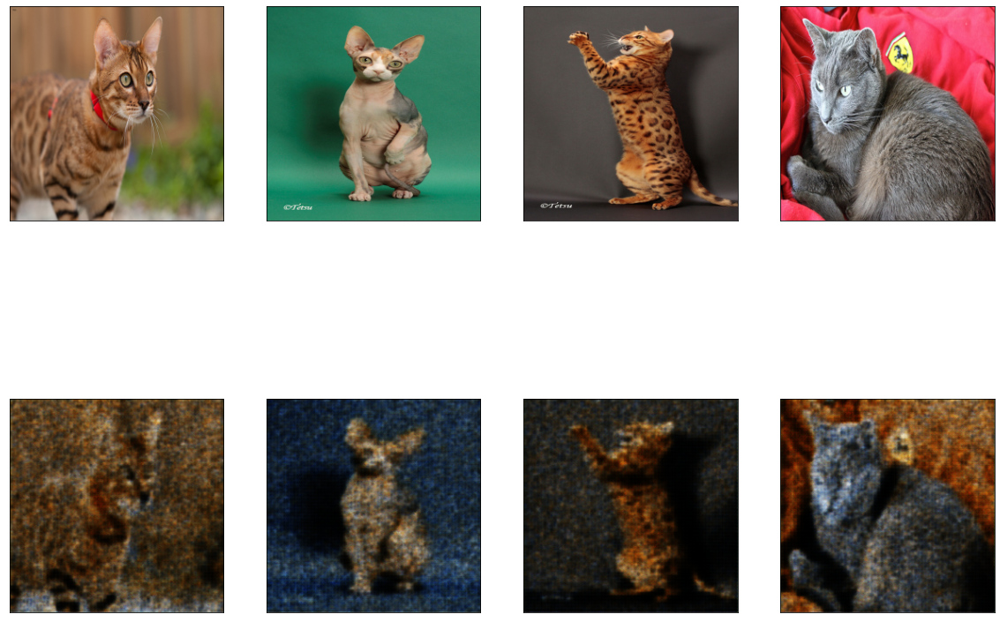

In [ ]:
n = 4  # How many digits we will display
plt.figure(figsize=(20, 15))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256, 256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()